<a href="https://colab.research.google.com/github/Jamee95/ubran_sound_classification/blob/main/Urban_Sound_Classification(UrbanSound8K)_complete.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Step 1: Install Required Libraries**
We’ll install all dependencies needed for audio processing, data handling, and machine learning.  
This includes:
- **Librosa** for audio feature extraction  
- **Resampy** for audio resampling  
- **Pandas/Numpy** for data manipulation  
- **Scikit-learn** for machine learning models  
- **Seaborn/Matplotlib** for visualization  
- **Tqdm** for progress bars


In [ ]:
!pip install --upgrade --quiet librosa pandas numpy scikit-learn matplotlib seaborn tqdm resampy


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.9/60.9 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.2/19.2 MB 106.5 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 2.3.3 which is incompatible.


In [ ]:
# Force install the compatible versions of Pandas and NumPy
!pip install "pandas==2.2.2" "numpy<2.0"

  Using cached numpy-1.26.4-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.7/12.7 MB 90.0 MB/s eta 0:00:00
Using cached numpy-1.26.4-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.0 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: pandas
    Found existing installation: pandas 2.3.3
    Uninstalling pandas-2.3.3:
      Successfully uninstalled pandas-2.3.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
jax 0.7.2 requires numpy>=2.0, but you have numpy 1.26.4 which is incompatible.
opencv-python-headless 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
opencv-python 4.12.0.88 requires n

#  **Step 2: Download the UrbanSound8K Dataset**
The **UrbanSound8K dataset** is publicly available on **Zenodo**.  
This dataset contains **8,732 labeled audio clips** divided into **10 sound classes** (e.g., siren, dog bark, car horn).

We’ll download and extract the dataset directly into Colab.


In [ ]:
%%bash
mkdir -p /content/datasets
cd /content/datasets

# Download from Zenodo (UrbanSound8K official link)
wget -O UrbanSound8K.tar.gz "https://zenodo.org/record/1203745/files/UrbanSound8K.tar.gz?download=1"

# Extract the dataset
tar -xzf UrbanSound8K.tar.gz
mv UrbanSound8K /content/UrbanSound8K
ls -lh /content/UrbanSound8K

total 44K
drwx--x--x 12 1829600028 1829600028 4.0K May 19  2014 audio
-rw-------  1 1829600028 1829600028  26K May 19  2014 FREESOUNDCREDITS.txt
drwx--x--x  2 1829600028 1829600028 4.0K May 28  2014 metadata
-rwx--x--x  1 1829600028 1829600028 4.9K Jun  3  2014 UrbanSound8K_README.txt


--2025-12-06 14:24:14--  https://zenodo.org/record/1203745/files/UrbanSound8K.tar.gz?download=1
Resolving zenodo.org (zenodo.org)... 188.185.43.153, 137.138.52.235, 188.185.48.75, ...
Connecting to zenodo.org (zenodo.org)|188.185.43.153|:443... connected.
HTTP request sent, awaiting response... 301 MOVED PERMANENTLY
Location: /records/1203745/files/UrbanSound8K.tar.gz [following]
--2025-12-06 14:24:15--  https://zenodo.org/records/1203745/files/UrbanSound8K.tar.gz
Reusing existing connection to zenodo.org:443.
HTTP request sent, awaiting response... 200 OK
Length: 6023741708 (5.6G) [application/octet-stream]
Saving to: ‘UrbanSound8K.tar.gz’

     0K .......... .......... .......... .......... ..........  0%  148K 11h3m
    50K .......... .......... .......... .......... ..........  0%  326K 8h1m
   100K .......... .......... .......... .......... ..........  0% 11.4M 5h24m
   150K .......... .......... .......... .......... ..........  0%  129M 4h3m
   200K .......... .......... ......

#  **Step 3: Verify Folder Structure**
The UrbanSound8K dataset should contain:
- `audio/` folder — 10 subfolders (fold1–fold10)
- `metadata/UrbanSound8K.csv` — metadata file  
We’ll check that all necessary files exist.


In [ ]:
import os

root = "/content/UrbanSound8K"
print("Exists:", os.path.exists(root))
print("Top-level directories:", os.listdir(root))

meta = os.path.join(root, "metadata", "UrbanSound8K.csv")
audio_folder = os.path.join(root, "audio")

print("\nMetadata file found:", os.path.exists(meta))
print("Audio folder found:", os.path.isdir(audio_folder))
if os.path.isdir(audio_folder):
    print("Audio folds:", sorted(os.listdir(audio_folder))[:10])


Exists: True
Top-level directories: ['audio', 'metadata', 'FREESOUNDCREDITS.txt', 'UrbanSound8K_README.txt', '.DS_Store']

Metadata file found: True
Audio folder found: True
Audio folds: ['.DS_Store', 'fold1', 'fold10', 'fold2', 'fold3', 'fold4', 'fold5', 'fold6', 'fold7', 'fold8']


#  **Step 4: Load the Metadata File**
The metadata CSV contains:
- File name  
- Fold number  
- Sound class (label)  
- Class ID  

We’ll load it into a Pandas DataFrame and display the first few rows.


In [ ]:
import pandas as pd

meta_path = "/content/UrbanSound8K/metadata/UrbanSound8K.csv"
esc = pd.read_csv(meta_path)
print("Total samples:", len(esc))
display(esc.head())
print("Columns:", list(esc.columns))


Total samples: 8732


,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing


Columns: ['slice_file_name', 'fsID', 'start', 'end', 'salience', 'fold', 'classID', 'class']


#  **Step 5: Check Sound Categories**
We’ll view all sound classes (10 categories) and how many samples each contains.  
This helps verify the dataset balance.


In [ ]:
esc.columns = esc.columns.str.strip()

# Identify the correct column for class names
if 'class' in esc.columns:
    class_col = 'class'
elif 'category' in esc.columns:
    class_col = 'category'
else:
    raise RuntimeError("Couldn't find class column in UrbanSound8K metadata.")

# Show class distribution
class_counts = esc[class_col].value_counts().reset_index()
class_counts.columns = ["Class", "Count"]
display(class_counts)
print("Unique classes:", class_counts['Class'].tolist())


,Class,Count
0,dog_bark,1000
1,children_playing,1000
2,air_conditioner,1000
3,street_music,1000
4,jackhammer,1000
5,engine_idling,1000
6,drilling,1000
7,siren,929
8,car_horn,429
9,gun_shot,374


Unique classes: ['dog_bark', 'children_playing', 'air_conditioner', 'street_music', 'jackhammer', 'engine_idling', 'drilling', 'siren', 'car_horn', 'gun_shot']


#  **Step 6: Inspect a Sample Audio File**
We’ll load one random audio file from the dataset to confirm:
- File accessibility  
- Audio duration  
- Sampling rate


In [ ]:
import librosa

sample_row = esc.sample(1).iloc[0]
fold = sample_row['fold']
file_name = sample_row['slice_file_name']
sample_path = f"/content/UrbanSound8K/audio/fold{fold}/{file_name}"

print("Sample file:", sample_path)
y, sr = librosa.load(sample_path, sr=None)
print(f"Loaded: {len(y)} samples | Sample rate: {sr} Hz | Duration: {len(y)/sr:.2f}s")


Sample file: /content/UrbanSound8K/audio/fold9/138468-1-0-0.wav
Loaded: 158760 samples | Sample rate: 44100 Hz | Duration: 3.60s


#  **Step 7: Extract MFCC Features**
We’ll convert each audio clip into **MFCC features** (Mel-Frequency Cepstral Coefficients) —  
a compact numerical representation that captures sound characteristics.

Each file will be converted into a **40-dimensional vector**.


In [ ]:
import numpy as np
from tqdm import tqdm

audio_root = "/content/UrbanSound8K/audio"
features, labels = [], []

for i in tqdm(range(len(esc))):
    row = esc.iloc[i]
    fold = row['fold']
    file_name = row['slice_file_name']
    label = row[class_col]
    file_path = os.path.join(audio_root, f"fold{fold}", file_name)

    if not os.path.exists(file_path):
        continue

    try:
        y, sr = librosa.load(file_path, sr=None, res_type='kaiser_fast')
        mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=40)
        mfcc_mean = np.mean(mfcc.T, axis=0)
        features.append(mfcc_mean)
        labels.append(label)
    except Exception as e:
        print(f"Error processing {file_name}: {e}")


#  **Step 8: Create a DataFrame of Features**
Now we’ll organize our extracted MFCC features and labels into a Pandas DataFrame.  
We’ll also confirm the number of successfully processed samples.


In [ ]:
df_us8k = pd.DataFrame(features)
df_us8k["label"] = labels

print("Extracted samples:", len(df_us8k))
display(df_us8k.head())


Extracted samples: 8732


,0,1,2,3,4,5,6,7,8,9,...,31,32,33,34,35,36,37,38,39,label
0,-275.918427,119.492790,-98.211777,-66.515144,-42.606049,0.505064,-28.330936,-5.746868,9.992785,4.795413,...,-3.562050,1.710328,1.032513,-4.748237,-4.013623,0.116840,6.310030,1.492272,1.462320,dog_bark
1,-500.908417,185.106415,-86.532829,49.858852,9.230822,22.548958,-3.567174,12.220051,7.720085,-6.460395,...,-1.856354,0.372866,-3.269188,-1.969773,-1.598099,0.562077,0.463689,-0.359663,0.909601,children_playing
2,-531.195312,186.939941,-70.349174,40.429245,9.121050,18.398586,6.283287,15.504058,9.613504,-7.113613,...,-0.291962,0.287639,-3.358316,1.434628,-0.975246,2.386079,-0.347919,-3.844178,-0.731598,children_playing
3,-476.784424,160.333282,-62.952843,50.751171,-0.174326,32.791599,-17.469801,24.755478,-3.847781,-1.761177,...,-3.374203,-1.012279,-1.025993,-3.666373,-0.071535,-5.693184,1.876606,-1.428173,3.510687,children_playing
4,-521.244751,185.392670,-81.950478,46.473553,11.872086,23.491446,4.261837,13.637699,6.093240,-2.813455,...,-0.331205,2.441440,0.449653,1.609697,-2.679410,-0.054824,-2.050368,-1.784188,2.869685,children_playing


#  **Step 9: Display Class Counts in Extracted Dataset**
This confirms that all 10 sound categories were processed correctly  
and that class balance matches the original metadata.


In [ ]:
table = df_us8k["label"].value_counts().reset_index()
table.columns = ["Class", "Count"]
display(table)


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6))
sns.barplot(x='Class', y='Count', data=class_counts, palette='viridis')
plt.xlabel('Sound Class')
plt.ylabel('Number of Samples')
plt.title('Distribution of UrbanSound8K Classes')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# ***MODEL TRAINING AND EVALUATION***

#  **Step 10: Encode Labels and Split Dataset**
Before training, we must:
1. Convert class labels into numeric values using **LabelEncoder**  
2. Split the data into **training (80%)** and **testing (20%)** sets  
This ensures fair model evaluation on unseen samples.


In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

# Separate features and labels
X = df_us8k.drop(columns=['label'])
y = df_us8k['label']

# Encode string labels into numeric
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Split dataset
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)

print("Train samples:", len(X_train))
print("Test samples:", len(X_test))
print("Number of classes:", len(le.classes_))


Train samples: 6985
Test samples: 1747
Number of classes: 10


#  **Step 11: Define Evaluation Helper Function**
We’ll create a helper function to:
- Measure **training time**
- Predict on test data
- Compute metrics: accuracy, precision, recall, F1-score
- Display **classification report**, **confusion matrix**, and **ROC curve**


In [ ]:
import time
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, roc_curve
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize
import numpy as np
from sklearn.metrics import roc_curve, auc
from itertools import cycle

def evaluate_model(model, X_train, X_test, y_train, y_test, model_name):
    print(f"\n Training {model_name}...")
    start = time.time()
    model.fit(X_train, y_train)
    train_time = time.time() - start

    start_pred = time.time()
    y_pred = model.predict(X_test)
    pred_time = time.time() - start_pred

    # Metrics
    acc = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred, target_names=le.classes_)
    print(f"\n Classification Report for {model_name}:\n")
    print(report)
    print(f" Accuracy: {acc:.4f}")

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
    plt.title(f"Confusion Matrix - {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

    # --- MULTI-CLASS ROC CURVES ---
    try:
        # We need to binarize the labels for multi-class ROC
        y_test_bin = label_binarize(y_test, classes=np.arange(len(le.classes_)))
        n_classes = y_test_bin.shape[1]

        # Use probabilities if available for smooth curves; otherwise use hard predictions
        if hasattr(model, "predict_proba"):
            y_score = model.predict_proba(X_test)
        else:
            y_score = label_binarize(y_pred, classes=np.arange(len(le.classes_)))

        # Compute ROC curve and ROC area for each class
        fpr = dict()
        tpr = dict()
        roc_auc = dict()
        for i in range(n_classes):
            fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])

        # Plot all ROC curves
        plt.figure(figsize=(12, 8))
        colors = cycle(['blue', 'red', 'green', 'orange', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan'])

        for i, color in zip(range(n_classes), colors):
            plt.plot(fpr[i], tpr[i], color=color, lw=2,
                     label=f'Class: {le.classes_[i]} (AUC = {roc_auc[i]:.2f})')

        plt.plot([0, 1], [0, 1], 'k--', lw=2) # Diagonal line
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'ROC Curve per Class - {model_name}')
        plt.legend(loc="lower right")
        plt.grid(alpha=0.3)
        plt.show()

    except Exception as e:
        print(f"Could not plot ROC curves: {e}")

    return {"model": model_name, "accuracy": acc, "train_time": train_time, "pred_time": pred_time}

# **Step 12: Train Random Forest Classifier**
Random Forest is a strong baseline model for tabular features like MFCCs.  
We’ll train it on the extracted features and evaluate performance.



 Training Random Forest...

 Classification Report for Random Forest:

                  precision    recall  f1-score   support

 air_conditioner       0.97      0.96      0.97       200
        car_horn       0.99      0.79      0.88        86
children_playing       0.83      0.90      0.86       200
        dog_bark       0.82      0.85      0.84       200
        drilling       0.91      0.93      0.92       200
   engine_idling       0.96      0.96      0.96       200
        gun_shot       0.96      0.67      0.79        75
      jackhammer       0.94      0.95      0.95       200
           siren       0.95      0.96      0.95       186
    street_music       0.83      0.87      0.85       200

        accuracy                           0.90      1747
       macro avg       0.92      0.88      0.90      1747
    weighted avg       0.91      0.90      0.90      1747

 Accuracy: 0.9044


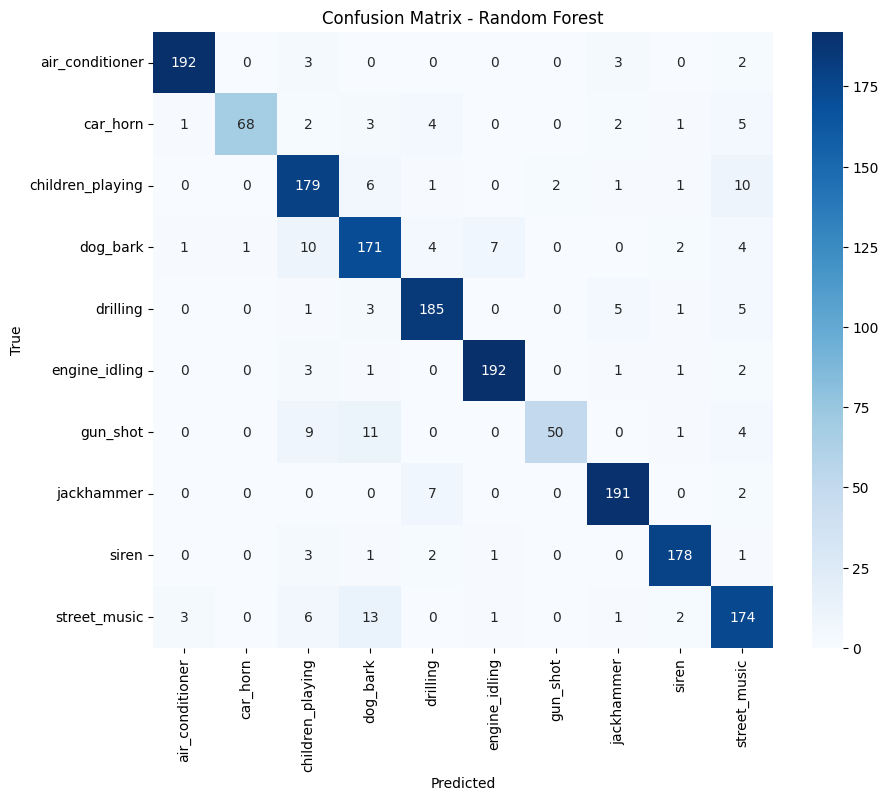

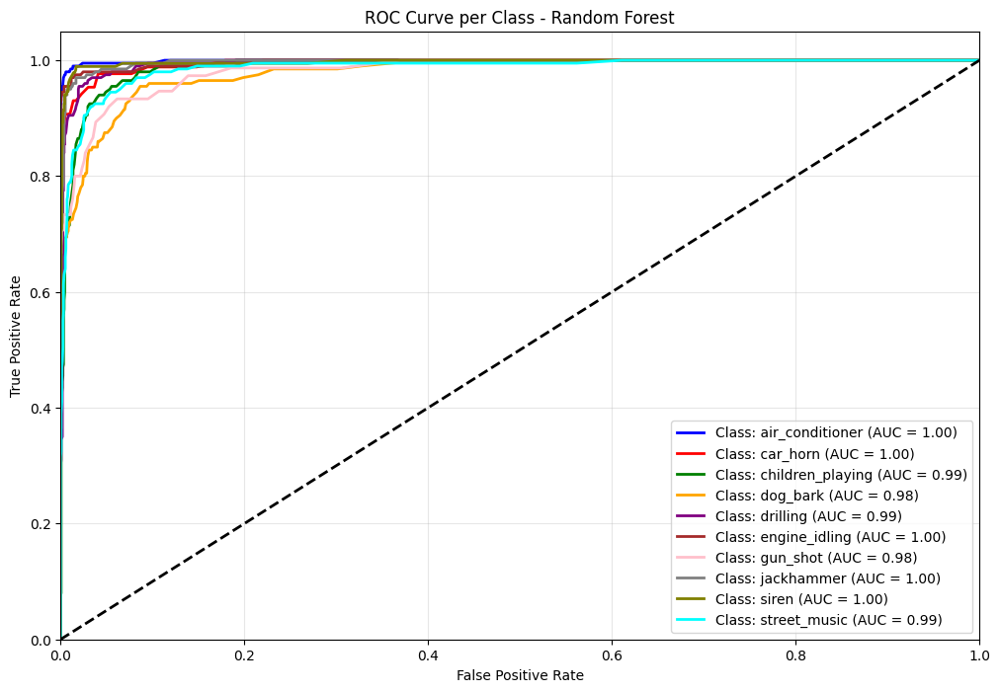

In [ ]:
# !pip install --force-reinstall --upgrade --quiet scikit-learn numpy scipy
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=200, random_state=42)
rf_results = evaluate_model(rf, X_train, X_test, y_train, y_test, "Random Forest")

#  **Step 13: Train Support Vector Machine (SVM)**
SVM is a robust classifier for high-dimensional spaces (like MFCC features).  
We’ll use the RBF kernel for non-linear classification.



 Training Support Vector Machine...

 Classification Report for Support Vector Machine:

                  precision    recall  f1-score   support

 air_conditioner       0.61      0.80      0.69       200
        car_horn       0.96      0.51      0.67        86
children_playing       0.62      0.62      0.62       200
        dog_bark       0.66      0.69      0.67       200
        drilling       0.70      0.67      0.68       200
   engine_idling       0.77      0.73      0.75       200
        gun_shot       0.82      0.31      0.45        75
      jackhammer       0.73      0.83      0.78       200
           siren       0.88      0.80      0.83       186
    street_music       0.55      0.62      0.59       200

        accuracy                           0.69      1747
       macro avg       0.73      0.66      0.67      1747
    weighted avg       0.71      0.69      0.69      1747

 Accuracy: 0.6920


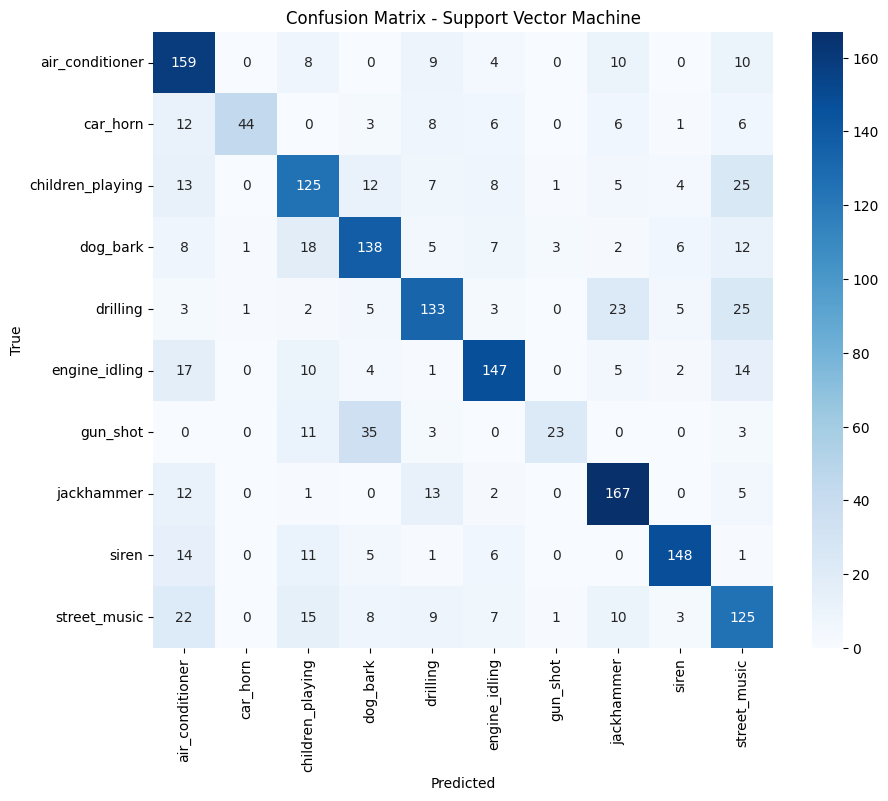

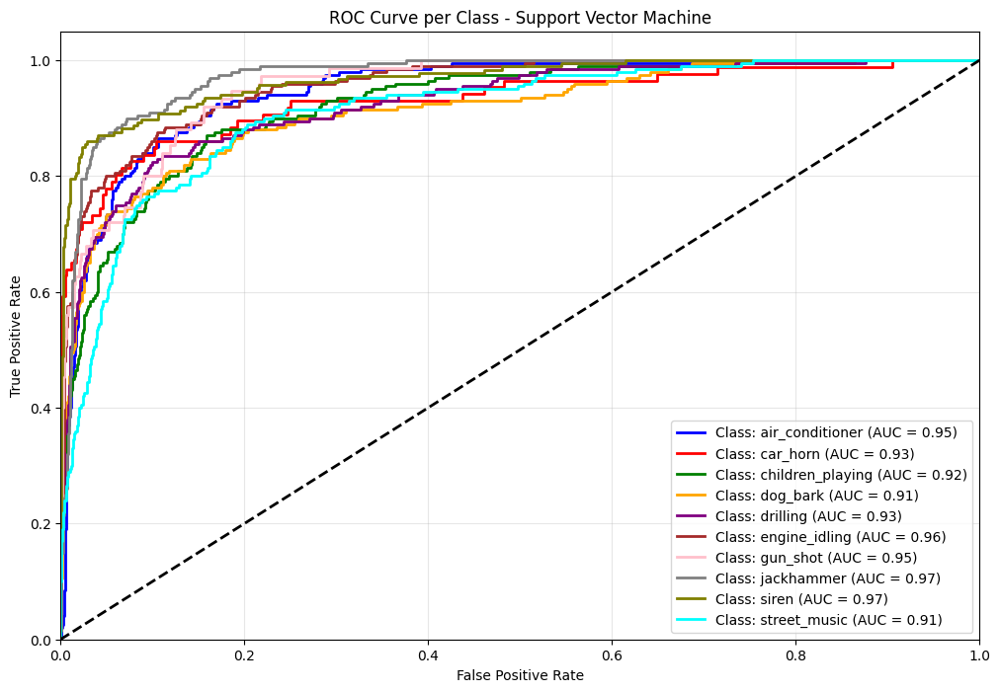

In [ ]:
from sklearn.svm import SVC

svm = SVC(kernel='rbf', gamma='scale', C=5, probability=True)
svm_results = evaluate_model(svm, X_train, X_test, y_train, y_test, "Support Vector Machine")


#  **Step 14: Train MLP Neural Network**
We’ll use a simple **Multi-Layer Perceptron (MLP)** classifier as a lightweight neural baseline.  
It can model non-linear relationships between MFCC features.



 Training MLP Neural Network...


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(



 Classification Report for MLP Neural Network:

                  precision    recall  f1-score   support

 air_conditioner       0.94      0.94      0.94       200
        car_horn       0.96      0.86      0.91        86
children_playing       0.86      0.71      0.78       200
        dog_bark       0.89      0.85      0.87       200
        drilling       0.87      0.93      0.90       200
   engine_idling       0.94      0.96      0.95       200
        gun_shot       0.84      0.75      0.79        75
      jackhammer       0.97      0.90      0.93       200
           siren       0.87      0.96      0.91       186
    street_music       0.73      0.88      0.80       200

        accuracy                           0.88      1747
       macro avg       0.89      0.87      0.88      1747
    weighted avg       0.89      0.88      0.88      1747

 Accuracy: 0.8815


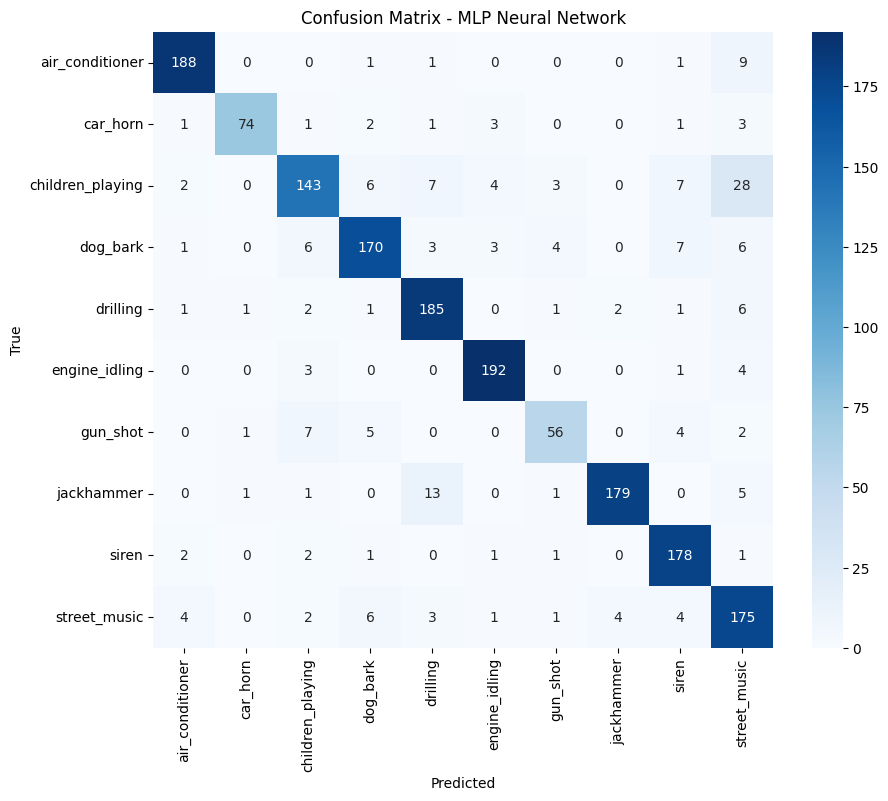

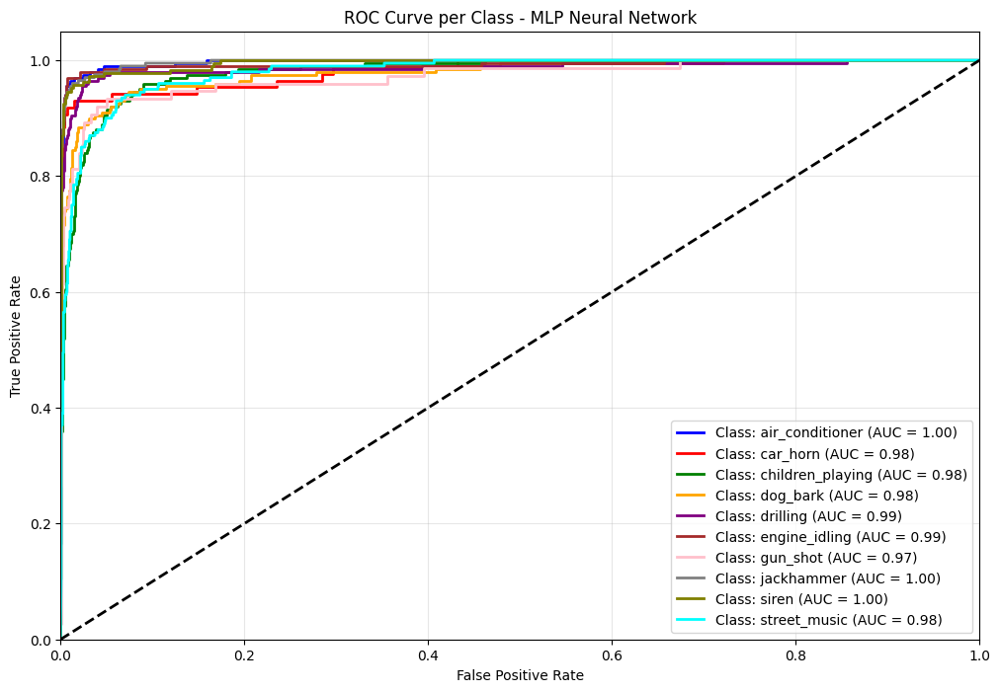

In [ ]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(256,128), activation='relu', solver='adam', max_iter=100, random_state=42)
mlp_results = evaluate_model(mlp, X_train, X_test, y_train, y_test, "MLP Neural Network")


#  **Step 15: Compare Model Performances**
We’ll summarize all models’ accuracy, training time, and prediction time  
in a single comparison table for easy interpretation.


,model,accuracy,train_time,pred_time
0,Random Forest,0.904408,12.204643,0.078932
1,MLP Neural Network,0.881511,12.899776,0.008705
2,Support Vector Machine,0.692044,12.092355,0.773095


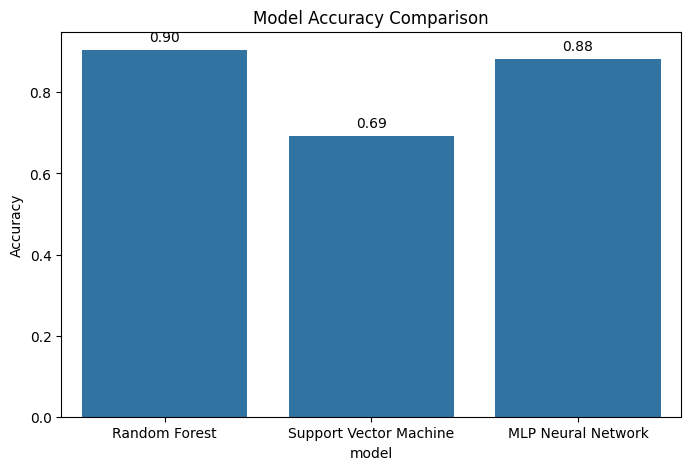

In [ ]:
results_df = pd.DataFrame([rf_results, svm_results, mlp_results])
display(results_df.sort_values(by='accuracy', ascending=False).reset_index(drop=True))

plt.figure(figsize=(8,5))
ax = sns.barplot(x='model', y='accuracy', data=results_df)
plt.title("Model Accuracy Comparison")
plt.ylabel("Accuracy")

# Add numbers on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 9),
                textcoords='offset points')

plt.show()

#  **Step 16: Apply K-Fold Cross-Validation**
To make our evaluation statistically reliable, we’ll apply **5-Fold Cross-Validation**.

- The dataset will be split into 5 equal folds.  
- Each fold will act as a test set once, while the other 4 folds are used for training.  
- We’ll repeat this for all models (Random Forest, SVM, MLP).  

We’ll track **accuracy**, **precision**, **recall**, **F1-score**, and **training time** for each fold,  
then compute the **average performance** for every model.


In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import numpy as np
import pandas as pd
import time

def kfold_evaluate(model, X, y, model_name, n_splits=5):
    print(f"\nPerforming {n_splits}-Fold Cross-Validation for {model_name}...")
    kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    # Dictionary to store scores for every fold
    all_results = {'accuracy': [], 'precision': [], 'recall': [], 'f1': [], 'train_time': []}

    fold = 1
    for train_index, test_index in kf.split(X, y):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y[train_index], y[test_index]

        start = time.time()
        model.fit(X_train, y_train)
        train_time = time.time() - start

        y_pred = model.predict(X_test)

        # Calculate metrics for this fold
        acc = accuracy_score(y_test, y_pred)
        prec = precision_score(y_test, y_pred, average='macro', zero_division=0)
        rec = recall_score(y_test, y_pred, average='macro', zero_division=0)
        f1 = f1_score(y_test, y_pred, average='macro', zero_division=0)

        # Store in lists
        all_results['accuracy'].append(acc)
        all_results['precision'].append(prec)
        all_results['recall'].append(rec)
        all_results['f1'].append(f1)
        all_results['train_time'].append(train_time)

        print(f"  > Fold {fold}: Acc={acc:.4f}, F1={f1:.4f}, Time={train_time:.2f}s")
        fold += 1

    # --- Calculate Mean and Standard Deviation ---
    mean_acc = np.mean(all_results['accuracy'])
    std_acc = np.std(all_results['accuracy'])

    mean_prec = np.mean(all_results['precision'])
    std_prec = np.std(all_results['precision'])

    mean_rec = np.mean(all_results['recall'])
    std_rec = np.std(all_results['recall'])

    mean_f1 = np.mean(all_results['f1'])
    std_f1 = np.std(all_results['f1'])

    mean_time = np.mean(all_results['train_time'])

    # Print nicely formatted summary
    print(f"\n--- {model_name} Final Results (Mean ± Std) ---")
    print(f"Accuracy:  {mean_acc:.4f} ± {std_acc:.4f}")
    print(f"Precision: {mean_prec:.4f} ± {std_prec:.4f}")
    print(f"Recall:    {mean_rec:.4f} ± {std_rec:.4f}")
    print(f"F1-Score:  {mean_f1:.4f} ± {std_f1:.4f}")

    # Return dictionary with both Mean and Std for DataFrame creation later
    results = {
        "Model": model_name,
        "Accuracy": mean_acc,
        "Accuracy Std": std_acc,
        "Precision": mean_prec,
        "Precision Std": std_prec,
        "Recall": mean_rec,
        "Recall Std": std_rec,
        "F1-Score": mean_f1,
        "F1-Score Std": std_f1,
        "Avg Train Time (s)": mean_time
    }
    return results

# **Step 17: Evaluate All Models with 5-Fold CV**
We’ll perform K-Fold evaluation for:
1. Random Forest  
2. Support Vector Machine  
3. MLP Neural Network  
and then compare their average metrics side by side.


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier

models = [
    ("Random Forest", RandomForestClassifier(n_estimators=200, random_state=42)),
    ("Support Vector Machine", SVC(kernel='rbf', gamma='scale', C=5)),
    ("MLP Neural Network", MLPClassifier(hidden_layer_sizes=(256,128), activation='relu', solver='adam', max_iter=100, random_state=42))
]

kfold_results = []
for name, model in models:
    res = kfold_evaluate(model, X, y_encoded, name)
    kfold_results.append(res)

results_kf_df = pd.DataFrame(kfold_results)
display(results_kf_df)



Performing 5-Fold Cross-Validation for Random Forest...
  > Fold 1: Acc=0.9170, F1=0.9120, Time=12.41s
  > Fold 2: Acc=0.9193, F1=0.9140, Time=12.43s
  > Fold 3: Acc=0.9038, F1=0.8988, Time=12.43s
  > Fold 4: Acc=0.9107, F1=0.9027, Time=12.35s
  > Fold 5: Acc=0.9147, F1=0.9112, Time=12.47s

--- Random Forest Final Results (Mean ± Std) ---
Accuracy:  0.9131 ± 0.0055
Precision: 0.9241 ± 0.0049
Recall:    0.8975 ± 0.0066
F1-Score:  0.9077 ± 0.0059

Performing 5-Fold Cross-Validation for Support Vector Machine...
  > Fold 1: Acc=0.6955, F1=0.6823, Time=2.77s
  > Fold 2: Acc=0.6961, F1=0.6720, Time=2.08s
  > Fold 3: Acc=0.6816, F1=0.6702, Time=2.00s
  > Fold 4: Acc=0.6976, F1=0.6857, Time=1.88s
  > Fold 5: Acc=0.6970, F1=0.6890, Time=2.33s

--- Support Vector Machine Final Results (Mean ± Std) ---
Accuracy:  0.6935 ± 0.0060
Precision: 0.7316 ± 0.0109
Recall:    0.6662 ± 0.0061
F1-Score:  0.6798 ± 0.0075

Performing 5-Fold Cross-Validation for MLP Neural Network...


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


  > Fold 1: Acc=0.9056, F1=0.9027, Time=13.87s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


  > Fold 2: Acc=0.8930, F1=0.8920, Time=14.64s
  > Fold 3: Acc=0.8551, F1=0.8422, Time=13.63s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


  > Fold 4: Acc=0.9032, F1=0.8954, Time=12.86s
  > Fold 5: Acc=0.8963, F1=0.8922, Time=13.71s

--- MLP Neural Network Final Results (Mean ± Std) ---
Accuracy:  0.8906 ± 0.0183
Precision: 0.8898 ± 0.0217
Recall:    0.8855 ± 0.0173
F1-Score:  0.8849 ± 0.0217


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


,Model,Accuracy,Accuracy Std,Precision,Precision Std,Recall,Recall Std,F1-Score,F1-Score Std,Avg Train Time (s)
0,Random Forest,0.913077,0.005456,0.924092,0.004870,0.897492,0.006648,0.907750,0.005918,12.416052
1,Support Vector Machine,0.693540,0.006036,0.731570,0.010929,0.666191,0.006121,0.679809,0.007460,2.214819
2,MLP Neural Network,0.890630,0.018338,0.889820,0.021707,0.885512,0.017306,0.884887,0.021692,13.742953


# **Step 18: Visualize Cross-Validation Results**
Now we’ll visualize the mean performance metrics of each model across all folds.


/tmp/ipython-input-2648459410.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Model", y="Accuracy", data=results_kf_df, palette="viridis")


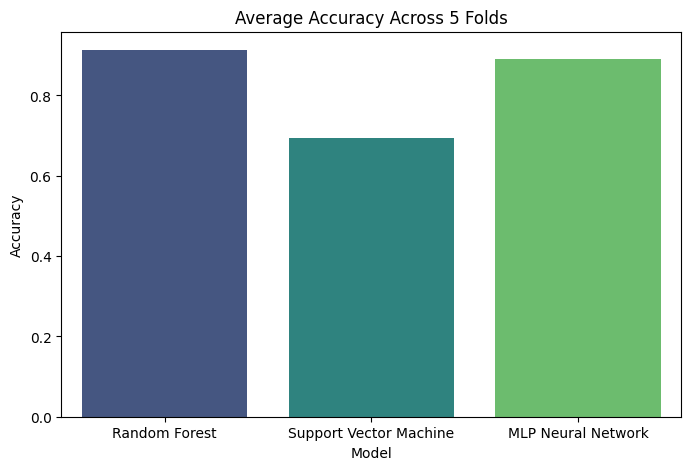

/tmp/ipython-input-2648459410.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Model", y="F1-Score", data=results_kf_df, palette="mako")


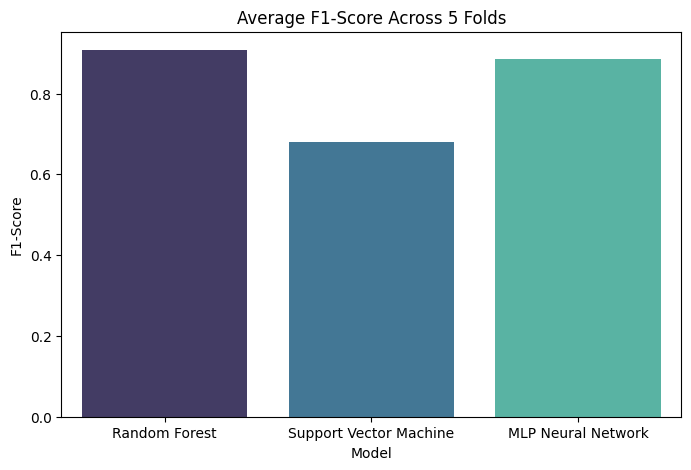

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
sns.barplot(x="Model", y="Accuracy", data=results_kf_df, palette="viridis")
plt.title("Average Accuracy Across 5 Folds")
plt.ylabel("Accuracy")
plt.show()

plt.figure(figsize=(8,5))
sns.barplot(x="Model", y="F1-Score", data=results_kf_df, palette="mako")
plt.title("Average F1-Score Across 5 Folds")
plt.ylabel("F1-Score")
plt.show()


# **CNN model**

In [ ]:
X_np = X.to_numpy()
X_cnn = X_np.reshape(X_np.shape[0], X_np.shape[1], 1)

print("Original X shape (DataFrame):", X.shape)
print("Original X shape (NumPy array):", X_np.shape)
print("Reshaped X for CNN (X_cnn) shape:", X_cnn.shape)

Original X shape (DataFrame): (8732, 40)
Original X shape (NumPy array): (8732, 40)
Reshaped X for CNN (X_cnn) shape: (8732, 40, 1)


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense

# Get the input shape from X_cnn and the number of classes
input_shape = (X_cnn.shape[1], X_cnn.shape[2]) # (40, 1)
num_classes = len(le.classes_)

# Define the CNN model
cnn_model = Sequential([
    Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=input_shape),
    MaxPooling1D(pool_size=2),
    Conv1D(filters=128, kernel_size=3, activation='relu'),
    MaxPooling1D(pool_size=2),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(num_classes, activation='softmax')
])

# Compile the model
cnn_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

print("CNN Model Summary:")
cnn_model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


CNN Model Summary:


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 38, 64)         │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 19, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 17, 128)        │        24,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_1 (MaxPooling1D)  │ (None, 8, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 157,450 (615.04 KB)

 Trainable params: 157,450 (615.04 KB)

 Non-trainable params: 0 (0.00 B)

Train samples for CNN: 6985
Test samples for CNN: 1747

 Training CNN Neural Network...
55/55 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step

 Classification Report for CNN Neural Network:

                  precision    recall  f1-score   support

 air_conditioner       0.97      0.95      0.96       200
        car_horn       0.92      0.88      0.90        86
children_playing       0.84      0.90      0.87       200
        dog_bark       0.89      0.86      0.88       200
        drilling       0.90      0.94      0.92       200
   engine_idling       0.95      0.97      0.96       200
        gun_shot       0.91      0.79      0.84        75
      jackhammer       0.94      0.93      0.93       200
           siren       0.90      0.96      0.93       186
    street_music       0.88      0.82      0.85       200

        accuracy                           0.91      1747
       macro avg       0.91      0.90      0.90      1747
    weighted avg       0.91      0.91      0.91      1747

 Accuracy

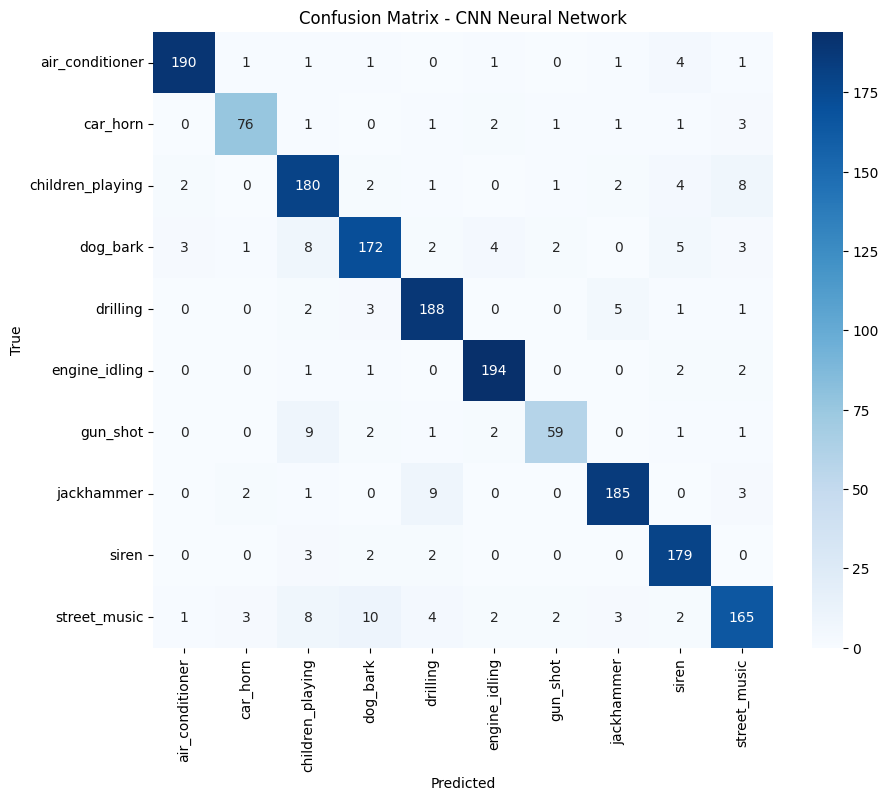

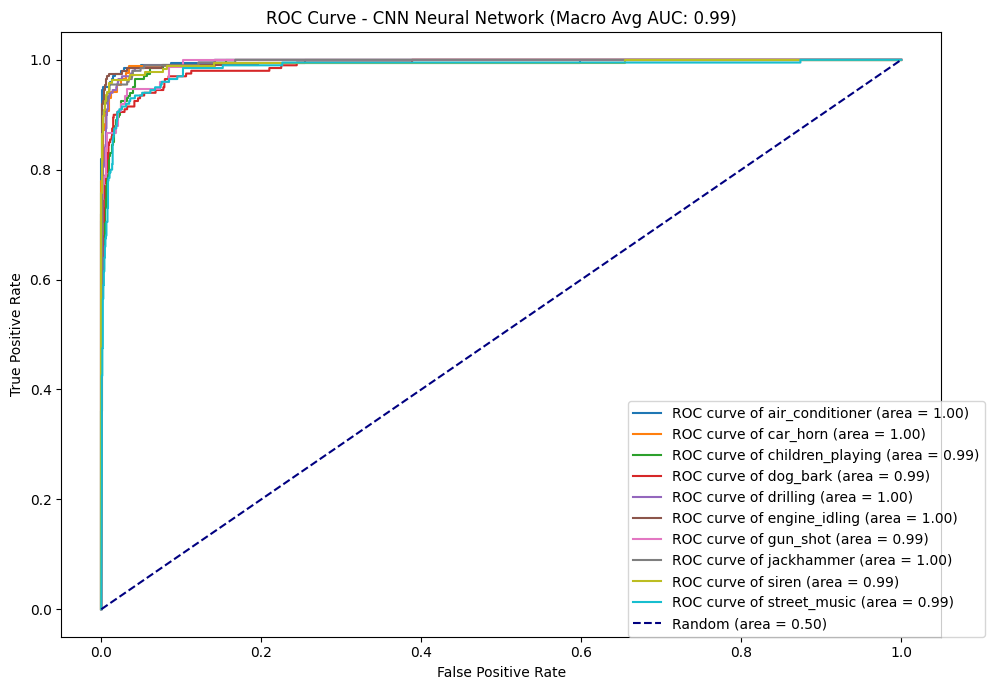

In [ ]:
import time
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import label_binarize
import numpy as np
from sklearn.model_selection import train_test_split

# Re-split data specifically for CNN, ensuring consistency with previous split parameters
X_train_cnn, X_test_cnn, y_train_cnn, y_test_cnn = train_test_split(
    X_cnn, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
)

print("Train samples for CNN:", len(X_train_cnn))
print("Test samples for CNN:", len(X_test_cnn))

def evaluate_cnn_model(model, X_train, X_test, y_train, y_test, model_name, epochs=100, batch_size=32):
    print(f"\n Training {model_name}...")
    start = time.time()
    history = model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.1, verbose=0)
    train_time = time.time() - start

    start_pred = time.time()
    y_pred_proba = model.predict(X_test)
    y_pred = np.argmax(y_pred_proba, axis=1)
    pred_time = time.time() - start_pred

    # Metrics
    acc = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred, target_names=le.classes_)
    print(f"\n Classification Report for {model_name}:\n")
    print(report)
    print(f" Accuracy: {acc:.4f}")
    print(f" Training Time: {train_time:.2f}s | Prediction Time: {pred_time:.2f}s")

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(10, 8))

    # Updated line: fmt='d' ensures numbers are displayed as integers
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)

    plt.title(f"Confusion Matrix - {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

    # ROC Curve (one-vs-rest)
    y_test_bin = label_binarize(y_test, classes=np.arange(len(le.classes_)))
    try:
        roc_auc = roc_auc_score(y_test_bin, y_pred_proba, average='macro')

        plt.figure(figsize=(10, 7))
        for i, class_name in enumerate(le.classes_):
            fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_pred_proba[:, i])
            plt.plot(fpr, tpr, label=f'ROC curve of {class_name} (area = {auc(fpr, tpr):.2f})')

        plt.plot([0, 1], [0, 1], linestyle='--', color='navy', label='Random (area = 0.50)')
        plt.title(f"ROC Curve - {model_name} (Macro Avg AUC: {roc_auc:.2f})")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.legend(loc="lower right", bbox_to_anchor=(1.05, 0.0), borderaxespad=0.)
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print("ROC computation skipped:", e)

    return {"model": model_name, "accuracy": acc, "train_time": train_time, "pred_time": pred_time}

# Evaluate the CNN model
cnn_results = evaluate_cnn_model(cnn_model, X_train_cnn, X_test_cnn, y_train_cnn, y_test_cnn, "CNN Neural Network")

,model,accuracy,train_time,pred_time
0,CNN Neural Network,0.908987,67.531672,0.846506
1,Random Forest,0.904408,12.204643,0.078932
2,MLP Neural Network,0.881511,12.899776,0.008705
3,Support Vector Machine,0.692044,12.092355,0.773095


/tmp/ipython-input-2479896408.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='model', y='accuracy', data=results_df_updated, palette='viridis')


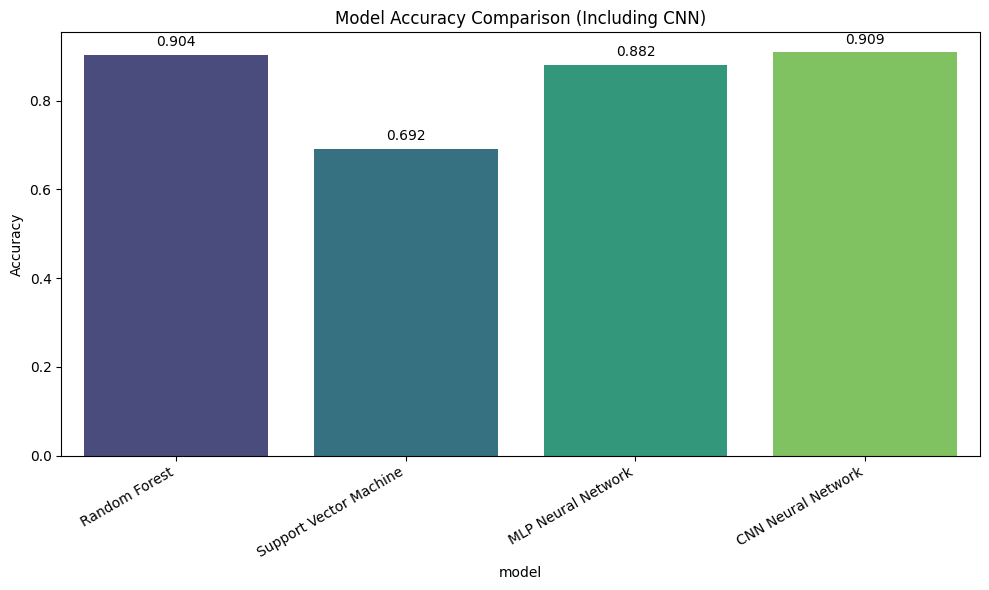

In [ ]:
results_df_updated = pd.DataFrame([rf_results, svm_results, mlp_results, cnn_results])
display(results_df_updated.sort_values(by='accuracy', ascending=False).reset_index(drop=True))

plt.figure(figsize=(10,6))
ax = sns.barplot(x='model', y='accuracy', data=results_df_updated, palette='viridis')
plt.title("Model Accuracy Comparison (Including CNN)")
plt.ylabel("Accuracy")
plt.xticks(rotation=30, ha='right')

# Add numbers on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height():.3f}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 9),
                textcoords='offset points')

plt.tight_layout()
plt.show()

,model,accuracy,train_time,pred_time
0,CNN Neural Network,0.908987,67.531672,0.846506
1,Random Forest,0.904408,12.204643,0.078932
2,MLP Neural Network,0.881511,12.899776,0.008705
3,Support Vector Machine,0.692044,12.092355,0.773095


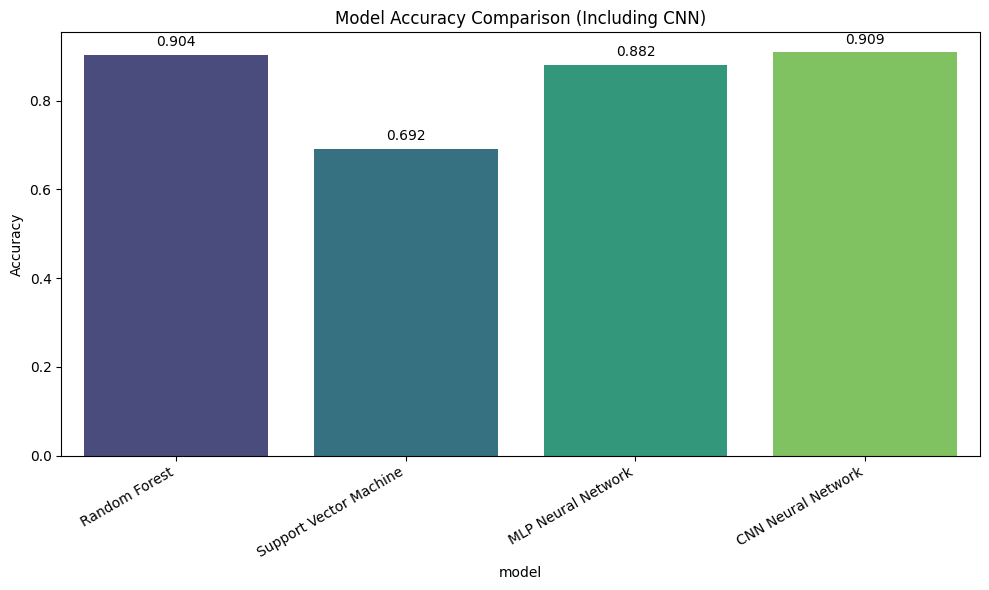

In [ ]:
results_df_updated = pd.DataFrame([rf_results, svm_results, mlp_results, cnn_results])
display(results_df_updated.sort_values(by='accuracy', ascending=False).reset_index(drop=True))

plt.figure(figsize=(10,6))
ax = sns.barplot(x='model', y='accuracy', hue='model', data=results_df_updated, palette='viridis', legend=False)
plt.title("Model Accuracy Comparison (Including CNN)")
plt.ylabel("Accuracy")
plt.xticks(rotation=30, ha='right')

# Add numbers on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height():.3f}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 9),
                textcoords='offset points')

plt.tight_layout()
plt.show()

Starting 5-Fold Cross-Validation for CNN...

Processing Fold 1/5...
  > Fold 1 Accuracy: 0.9067
Processing Fold 2/5...
  > Fold 2 Accuracy: 0.8741
Processing Fold 3/5...
  > Fold 3 Accuracy: 0.8717
Processing Fold 4/5...
  > Fold 4 Accuracy: 0.8918
Processing Fold 5/5...
  > Fold 5 Accuracy: 0.8379

AVERAGE ACCURACY (5-Fold CV): 0.8764

Aggregated Classification Report:

                  precision    recall  f1-score   support

 air_conditioner       0.91      0.93      0.92      1000
        car_horn       0.86      0.89      0.88       429
children_playing       0.79      0.82      0.80      1000
        dog_bark       0.84      0.79      0.81      1000
        drilling       0.84      0.93      0.88      1000
   engine_idling       0.93      0.96      0.94      1000
        gun_shot       0.89      0.81      0.85       374
      jackhammer       0.96      0.92      0.94      1000
           siren       0.95      0.90      0.93       929
    street_music       0.82      0.78      0.

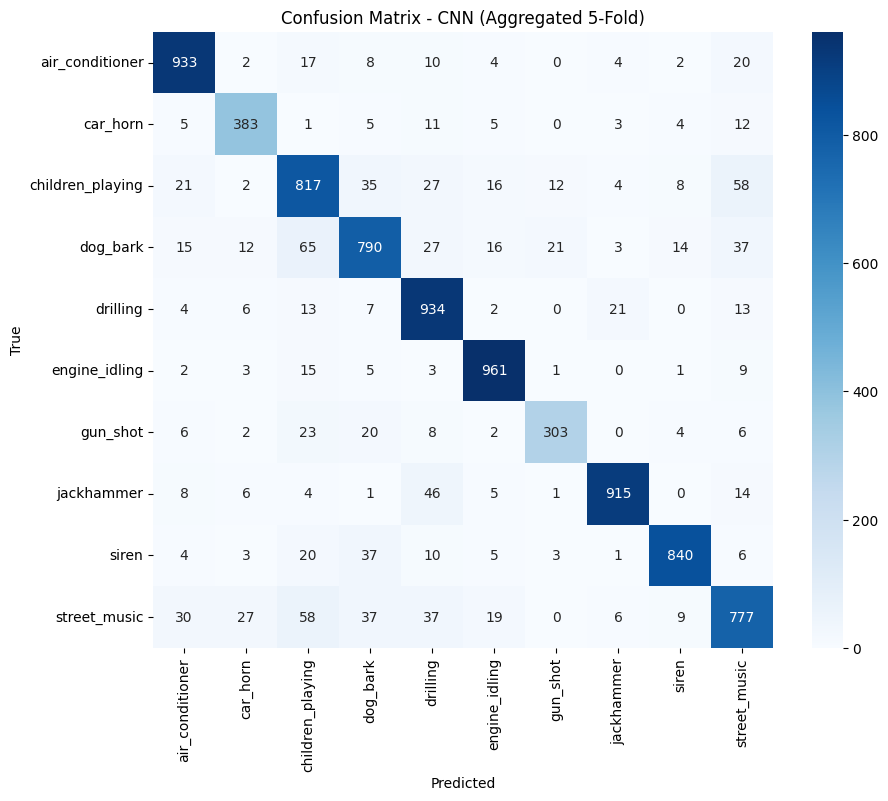

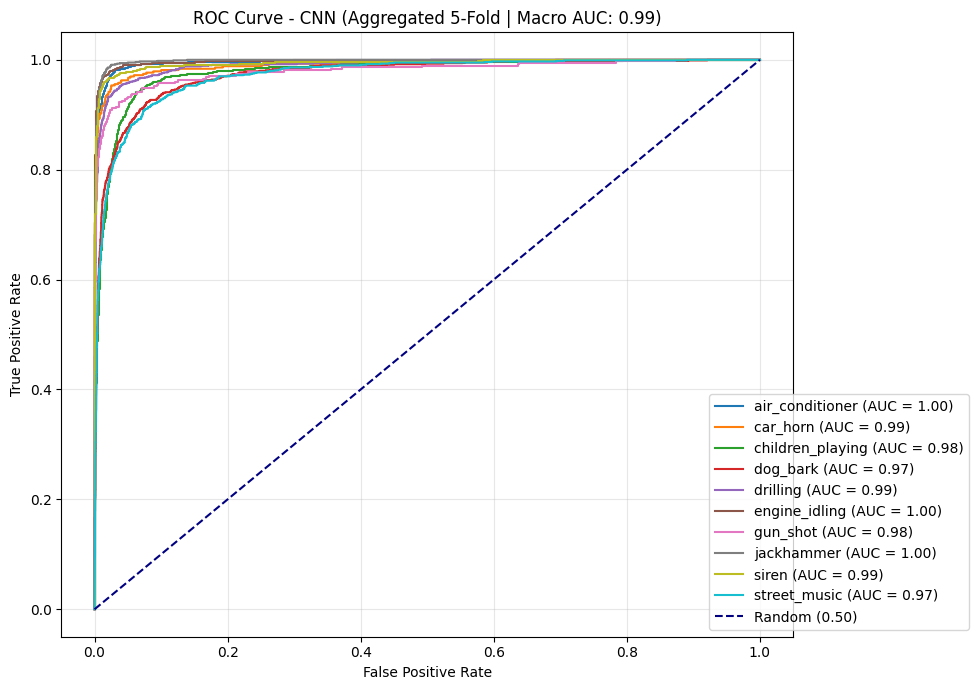

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, roc_curve, auc
from sklearn.preprocessing import label_binarize
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, Flatten, MaxPooling1D, Input

# --- 1. Define a Function to Construct a Fresh Model ---
# We need this to reset the model weights for every fold
def create_cnn_model(input_shape, num_classes):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Conv1D(filters=64, kernel_size=3, activation='relu'))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dense(num_classes, activation='softmax'))

    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    return model

# --- 2. Setup Cross-Validation ---
n_splits = 5
kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Lists to store results from every fold
fold_accuracies = []
y_true_all = []    # Store true labels from all folds
y_pred_all = []    # Store predicted labels from all folds
y_prob_all = []    # Store predicted probabilities from all folds

print(f"Starting {n_splits}-Fold Cross-Validation for CNN...\n")

# --- 3. The Training Loop ---
for fold, (train_idx, test_idx) in enumerate(kf.split(X_cnn, y_encoded)):
    print(f"Processing Fold {fold+1}/{n_splits}...")

    # Split data for this fold
    X_train_fold, X_test_fold = X_cnn[train_idx], X_cnn[test_idx]
    y_train_fold, y_test_fold = y_encoded[train_idx], y_encoded[test_idx]

    # Create a FRESH model instance
    model = create_cnn_model(input_shape=(X_train_fold.shape[1], 1),
                             num_classes=len(np.unique(y_encoded)))

    # Train
    model.fit(X_train_fold, y_train_fold, epochs=30, batch_size=32, verbose=0)

    # Predict
    y_prob = model.predict(X_test_fold, verbose=0)
    y_pred = np.argmax(y_prob, axis=1)

    # Store Score for this fold
    acc = accuracy_score(y_test_fold, y_pred)
    fold_accuracies.append(acc)
    print(f"  > Fold {fold+1} Accuracy: {acc:.4f}")

    # Collect data for final aggregate plots
    y_true_all.extend(y_test_fold)
    y_pred_all.extend(y_pred)
    y_prob_all.extend(y_prob)

# --- 4. Final Aggregated Results ---
average_acc = np.mean(fold_accuracies)
print("\n" + "="*40)
print(f"AVERAGE ACCURACY (5-Fold CV): {average_acc:.4f}")
print("="*40)

# Convert lists to numpy arrays for plotting
y_true_all = np.array(y_true_all)
y_pred_all = np.array(y_pred_all)
y_prob_all = np.array(y_prob_all)

# --- 5. Generate Plots (Aggregated) ---

# A. Classification Report
print("\nAggregated Classification Report:\n")
print(classification_report(y_true_all, y_pred_all, target_names=le.classes_))

# B. Confusion Matrix
cm = confusion_matrix(y_true_all, y_pred_all)
plt.figure(figsize=(10, 8))
# fmt='d' ensures integer display as requested
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.title(f"Confusion Matrix - CNN (Aggregated 5-Fold)")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

# C. ROC Curve
y_true_bin = label_binarize(y_true_all, classes=np.arange(len(le.classes_)))

try:
    roc_auc_macro = roc_auc_score(y_true_bin, y_prob_all, average='macro')

    plt.figure(figsize=(10, 7))
    # Plot ROC for each class
    for i, class_name in enumerate(le.classes_):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_prob_all[:, i])
        plt.plot(fpr, tpr, label=f'{class_name} (AUC = {auc(fpr, tpr):.2f})')

    plt.plot([0, 1], [0, 1], linestyle='--', color='navy', label='Random (0.50)')
    plt.title(f"ROC Curve - CNN (Aggregated 5-Fold | Macro AUC: {roc_auc_macro:.2f})")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right", bbox_to_anchor=(1.25, 0.0)) # Legend outside to avoid clutter
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()
except Exception as e:
    print("ROC computation skipped:", e)

In [ ]:
#4. Final Aggregated Results ---
average_acc = np.mean(fold_accuracies)
std_acc = np.std(fold_accuracies)  # <--- NEW: Calculate Standard Deviation

print("\n" + "="*40)
print(f"AVERAGE ACCURACY (5-Fold CV): {average_acc:.4f}")
print(f"STANDARD DEVIATION:           {std_acc:.4f}") # <--- NEW: Print it
print("="*40)

# Convert lists to numpy arrays for plotting
y_true_all = np.array(y_true_all)
y_pred_all = np.array(y_pred_all)
y_prob_all = np.array(y_prob_all)


AVERAGE ACCURACY (5-Fold CV): 0.8764
STANDARD DEVIATION:           0.0231


#  **Step 20: Statistical Significance Testing with Paired T-Test**

Now that we know **Random Forest** performed best,  
we’ll apply a **paired t-test** to check if its higher accuracy or F1-score  
is *statistically significant* compared to **SVM** and **MLP Neural Network**.

###  Why T-Test?
The **paired t-test** compares two related samples (e.g., model accuracies per fold):
- **Null Hypothesis (H₀):** There is *no significant difference* between the two models.
- **Alternative Hypothesis (H₁):** There *is a significant difference*.

We’ll use:
- `scipy.stats.ttest_rel` for paired comparison  
- p-value < 0.05 ⇒ reject H₀ (significant difference)


In [ ]:
# !pip install --force-reinstall --upgrade --quiet scikit-learn==1.4.2 numpy==1.26.4 scipy==1.13.0
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
from scipy.stats import ttest_rel
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, Flatten, MaxPooling1D, Input

# Function to create CNN model (copied from JPa48mqx5cvZ)
def create_cnn_model(input_shape, num_classes):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Conv1D(filters=64, kernel_size=3, activation='relu'))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dense(num_classes, activation='softmax'))

    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    return model

# Store per-fold results for each model
rf_scores, svm_scores, mlp_scores, cnn_scores = [], [], [], []

kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

print("Performing 5-Fold evaluation again to collect per-fold results...")

# Get number of classes for CNN model creation
num_classes = len(np.unique(y_encoded)) # Assuming y_encoded is available

for fold_idx, (train_idx, test_idx) in enumerate(kf.split(X, y_encoded)):
    print(f"Processing Fold {fold_idx+1}/5...")

    # Data for traditional models (RF, SVM, MLP)
    X_train_trad, X_test_trad = X.iloc[train_idx], X.iloc[test_idx]
    y_train_trad, y_test_trad = y_encoded[train_idx], y_encoded[test_idx]

    # Data for CNN model (needs X_cnn)
    X_train_cnn_fold = X_cnn[train_idx]
    X_test_cnn_fold = X_cnn[test_idx]
    y_train_cnn_fold = y_encoded[train_idx]
    y_test_cnn_fold = y_encoded[test_idx]

    # Initialize models
    rf = RandomForestClassifier(n_estimators=200, random_state=42)
    svm = SVC(kernel='rbf', gamma='scale', C=5)
    mlp = MLPClassifier(hidden_layer_sizes=(256,128), activation='relu', solver='adam', max_iter=100, random_state=42)
    cnn_model = create_cnn_model(input_shape=(X_train_cnn_fold.shape[1], X_train_cnn_fold.shape[2]),
                                 num_classes=num_classes)

    # Train models
    rf.fit(X_train_trad, y_train_trad)
    svm.fit(X_train_trad, y_train_trad)
    mlp.fit(X_train_trad, y_train_trad)
    cnn_model.fit(X_train_cnn_fold, y_train_cnn_fold, epochs=30, batch_size=32, verbose=0) # Use fewer epochs for CV to save time

    # Predict
    rf_pred = rf.predict(X_test_trad)
    svm_pred = svm.predict(X_test_trad)
    mlp_pred = mlp.predict(X_test_trad)
    cnn_pred = np.argmax(cnn_model.predict(X_test_cnn_fold, verbose=0), axis=1)

    # Store fold accuracies
    rf_scores.append(accuracy_score(y_test_trad, rf_pred))
    svm_scores.append(accuracy_score(y_test_trad, svm_pred))
    mlp_scores.append(accuracy_score(y_test_trad, mlp_pred))
    cnn_scores.append(accuracy_score(y_test_cnn_fold, cnn_pred))

print("Finished collecting per-fold results.")

Performing 5-Fold evaluation again to collect per-fold results...
Processing Fold 1/5...


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


Processing Fold 2/5...


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


Processing Fold 3/5...
Processing Fold 4/5...


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


Processing Fold 5/5...


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


Finished collecting per-fold results.


# **Step 21: Perform Paired T-Tests**

We’ll run **paired t-tests** between Random Forest and:
1. SVM  
2. MLP  

We’ll compare their fold-wise accuracies.
If the **p-value < 0.05**, we reject the null hypothesis —  
meaning Random Forest’s improvement is **statistically significant**.


In [ ]:
from scipy.stats import ttest_rel

# 1. Perform T-tests comparing Random Forest against the others
t_stat_svm, p_val_svm = ttest_rel(rf_scores, svm_scores)
t_stat_mlp, p_val_mlp = ttest_rel(rf_scores, mlp_scores)
t_stat_cnn, p_val_cnn = ttest_rel(rf_scores, cnn_scores)  # Added CNN comparison

print(" Paired T-Test Results (Random Forest vs Others):")
print("-" * 60)
print(f"Random Forest vs SVM -> t-statistic = {t_stat_svm:.4f}, p-value = {p_val_svm:.4f}")
print(f"Random Forest vs MLP -> t-statistic = {t_stat_mlp:.4f}, p-value = {p_val_mlp:.4f}")
print(f"Random Forest vs CNN -> t-statistic = {t_stat_cnn:.4f}, p-value = {p_val_cnn:.4f}")

print("\n--- Statistical Significance Interpretation (alpha = 0.05) ---")

# Evaluate SVM
if p_val_svm < 0.05:
    print(" RF vs SVM difference IS statistically significant.")
else:
    print(" RF vs SVM difference is NOT statistically significant.")

# Evaluate MLP
if p_val_mlp < 0.05:
    print(" RF vs MLP difference IS statistically significant.")
else:
    print(" RF vs MLP difference is NOT statistically significant.")

# Evaluate CNN
if p_val_cnn < 0.05:
    print(" RF vs CNN difference IS statistically significant.")
else:
    print(" RF vs CNN difference is NOT statistically significant.")

 Paired T-Test Results (Random Forest vs Others):
------------------------------------------------------------
Random Forest vs SVM -> t-statistic = 116.9856, p-value = 0.0000
Random Forest vs MLP -> t-statistic = 3.0741, p-value = 0.0371
Random Forest vs CNN -> t-statistic = 7.2357, p-value = 0.0019

--- Statistical Significance Interpretation (alpha = 0.05) ---
 RF vs SVM difference IS statistically significant.
 RF vs MLP difference IS statistically significant.
 RF vs CNN difference IS statistically significant.


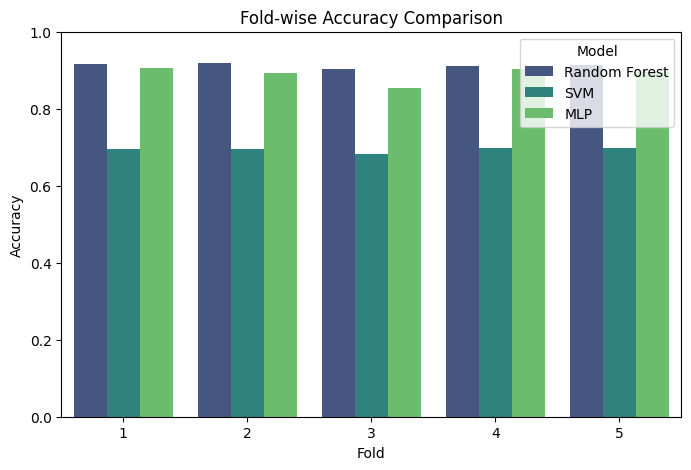

   Fold  Random Forest       SVM       MLP
0     1       0.917001  0.695478  0.905552
1     2       0.919290  0.696050  0.892959
2     3       0.903780  0.681558  0.855097
3     4       0.910653  0.697595  0.903207
4     5       0.914662  0.697022  0.896334


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

folds = np.arange(1, 6)
acc_df = pd.DataFrame({
    "Fold": folds,
    "Random Forest": rf_scores,
    "SVM": svm_scores,
    "MLP": mlp_scores
})

acc_melted = acc_df.melt(id_vars="Fold", var_name="Model", value_name="Accuracy")

plt.figure(figsize=(8,5))
sns.barplot(x="Fold", y="Accuracy", hue="Model", data=acc_melted, palette="viridis")
plt.title("Fold-wise Accuracy Comparison")
plt.ylim(0, 1)
plt.show()

print(acc_df)


# **Extract Mel Spectrogram Features for AST**



In [ ]:
import librosa
import numpy as np
import pandas as pd
from tqdm import tqdm
import os
audio_root = "/content/UrbanSound8K/audio"
# 1. Define constants
target_sr = 22050
n_fft = 2048
hop_length = 512
n_mels = 128
max_pad_len = 250  # This represents the number of time frames

print(f"Defined constants: target_sr={target_sr}, n_fft={n_fft}, hop_length={hop_length}, n_mels={n_mels}, max_pad_len={max_pad_len}")

# 2. Initialize empty lists
ast_features = []
ast_labels = []

# Access audio_root and esc from previous steps
# audio_root = "/content/UrbanSound8K/audio" # Already defined earlier
# esc = pd.read_csv(...) # Already loaded earlier

# 3. Iterate through each row of the esc DataFrame
print("\nExtracting Mel Spectrogram features...")
for i in tqdm(range(len(esc)), desc="Processing audio files"):
    row = esc.iloc[i]
    fold = row['fold']
    file_name = row['slice_file_name']
    label = row['class'] # Assuming 'class' is the correct label column

    # a. Construct the full file path
    file_path = os.path.join(audio_root, f"fold{fold}", file_name)

    if not os.path.exists(file_path):
        # print(f"Warning: File not found {file_path}. Skipping.")
        continue

    try:
        # b. Load the audio file, resampling to target_sr
        y, sr = librosa.load(file_path, sr=target_sr, res_type='kaiser_fast')

        # c. Compute the Mel Spectrogram
        melspec = librosa.feature.melspectrogram(y=y, sr=target_sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)

        # d. Convert to log scale
        melspec_db = librosa.power_to_db(melspec, ref=np.max)

        # e. Standardize dimensions (pad/trim)
        if melspec_db.shape[1] < max_pad_len:
            # Pad with zeros if shorter
            pad_width = max_pad_len - melspec_db.shape[1]
            padded_melspec = np.pad(melspec_db, pad_width=((0, 0), (0, pad_width)), mode='constant')
        else:
            # Trim if longer
            padded_melspec = melspec_db[:, :max_pad_len]

        # f. Append to lists
        ast_features.append(padded_melspec)
        ast_labels.append(label)

    except Exception as e:
        print(f"Error processing {file_name}: {e}. Skipping.")

# 5. Convert lists to NumPy array and Pandas Series
ast_features_array = np.array(ast_features)
ast_labels_series = pd.Series(ast_labels)

# 6. Print shape and display head
print("\nFeature extraction complete.")
print(f"Shape of ast_features_array: {ast_features_array.shape}")
print(f"Number of extracted labels: {len(ast_labels_series)}")
print("First 5 extracted labels:")
display(ast_labels_series.head())

Defined constants: target_sr=22050, n_fft=2048, hop_length=512, n_mels=128, max_pad_len=250

Extracting Mel Spectrogram features...


Processing audio files:  41%|████      | 3554/8732 [05:10<06:28, 13.33it/s]/usr/local/lib/python3.12/dist-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1323
  warnings.warn(
Processing audio files:  95%|█████████▌| 8326/8732 [11:25<00:18, 22.12it/s]/usr/local/lib/python3.12/dist-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1103
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1523
  warnings.warn(
Processing audio files: 100%|██████████| 8732/8732 [11:55<00:00, 12.20it/s]



Feature extraction complete.
Shape of ast_features_array: (8732, 128, 250)
Number of extracted labels: 8732
First 5 extracted labels:


,0
0,dog_bark
1,children_playing
2,children_playing
3,children_playing
4,children_playing


In [ ]:
pip install transformers accelerate evaluate scikit-learn torch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 4.0 MB/s eta 0:00:00


In [ ]:
import torch
from torch.utils.data import Dataset
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
from transformers import ASTConfig, ASTForAudioClassification, TrainingArguments, Trainer

# 1. Prepare Labels
label_encoder = LabelEncoder()
# Fit on the original pandas series labels
y_encoded = label_encoder.fit_transform(ast_labels_series)
num_labels = len(label_encoder.classes_)

print(f"Classes found: {label_encoder.classes_}")

# 2. Split Data (80% Train, 20% Test)
# We use 'stratify' to ensure all classes are represented in both sets
X_train, X_test, y_train, y_test = train_test_split(
    ast_features_array,
    y_encoded,
    test_size=0.2,
    random_state=42,
    stratify=y_encoded
)

# 3. Define Custom Dataset Class
class UrbanSoundASTDataset(Dataset):
    def __init__(self, features, labels):
        self.features = features
        self.labels = labels
        # Standard AST input length is 1024. Your data is 250.
        # We must pad it to 1024 to use pre-trained weights.
        self.target_length = 1024

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        # Get feature: Current shape (128, 250) -> (Freq, Time)
        feature = self.features[idx]
        label = self.labels[idx]

        # Convert to Tensor
        feature_tensor = torch.tensor(feature, dtype=torch.float32)

        # Transpose to (Time, Freq) -> Shape becomes (250, 128)
        # AST expects (Time, Freq)
        feature_tensor = feature_tensor.transpose(0, 1)

        # Normalize (Standardization is crucial for Transformers)
        mean = feature_tensor.mean()
        std = feature_tensor.std()
        if std != 0:
            feature_tensor = (feature_tensor - mean) / std

        # Pad to target_length (1024)
        current_len = feature_tensor.shape[0]
        pad_len = self.target_length - current_len

        if pad_len > 0:
            # Pad the Time dimension (dim 0), keep Freq (dim 1) as is
            # padding format: (left, right, top, bottom) for last 2 dims if 4D,
            # but for 2D tensors, torch.nn.functional.pad works differently depending on input.
            # Easiest way for (Time, Freq) is to create a zero tensor and place data in it.
            padded_feature = torch.zeros((self.target_length, 128))
            padded_feature[:current_len, :] = feature_tensor
            feature_tensor = padded_feature
        else:
            # If your data were longer than 1024, we would crop it
            feature_tensor = feature_tensor[:self.target_length, :]

        return {
            "input_values": feature_tensor,
            "labels": torch.tensor(label, dtype=torch.long)
        }

# Create Dataset Objects
train_dataset = UrbanSoundASTDataset(X_train, y_train)
test_dataset = UrbanSoundASTDataset(X_test, y_test)

print(f"Train Dataset Size: {len(train_dataset)}")
print(f"Test Dataset Size: {len(test_dataset)}")

Classes found: ['air_conditioner' 'car_horn' 'children_playing' 'dog_bark' 'drilling'
 'engine_idling' 'gun_shot' 'jackhammer' 'siren' 'street_music']
Train Dataset Size: 6985
Test Dataset Size: 1747


In [ ]:
from transformers import ASTForAudioClassification

# 1. Define the specific pre-trained model to download
model_checkpoint = "MIT/ast-finetuned-audioset-10-10-0.4593"

# 2. Load the model
# We use 'ignore_mismatched_sizes=True' because we are replacing the
# original 527-class layer with your 10-class layer.
model = ASTForAudioClassification.from_pretrained(
    model_checkpoint,
    num_labels=num_labels,
    ignore_mismatched_sizes=True
)

# 3. Map the internal IDs to your actual class names (e.g., 0 -> "dog_bark")
# This makes future predictions easier to read.
id2label = {i: label for i, label in enumerate(label_encoder.classes_)}
label2id = {label: i for i, label in enumerate(label_encoder.classes_)}
model.config.id2label = id2label
model.config.label2id = label2id

print("Model loaded successfully!")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ASTForAudioClassification were not initialized from the model checkpoint at MIT/ast-finetuned-audioset-10-10-0.4593 and are newly initialized because the shapes did not match:
- classifier.dense.bias: found shape torch.Size([527]) in the checkpoint and torch.Size([10]) in the model instantiated
- classifier.dense.weight: found shape torch.Size([527, 768]) in the checkpoint and torch.Size([10, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Model loaded successfully!


In [ ]:
# 4. Define Metrics Function
def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)

    # Calculate metrics
    precision, recall, f1, _ = precision_recall_fscore_support(labels, preds, average='weighted')
    acc = accuracy_score(labels, preds)

    return {
        'accuracy': acc,
        'f1': f1,
        'precision': precision,
        'recall': recall
    }

# 5. Load Pre-trained AST Model
# We use 'ignore_mismatched_sizes' because the original model has 527 classes (AudioSet),
# and we are changing it to 10 classes (UrbanSound8K).
model_checkpoint = "MIT/ast-finetuned-audioset-10-10-0.4593"

model = ASTForAudioClassification.from_pretrained(
    model_checkpoint,
    num_labels=num_labels,
    ignore_mismatched_sizes=True
)

# Map label IDs to names for better inference later
id2label = {i: label for i, label in enumerate(label_encoder.classes_)}
label2id = {label: i for i, label in enumerate(label_encoder.classes_)}
model.config.id2label = id2label
model.config.label2id = label2id

Some weights of ASTForAudioClassification were not initialized from the model checkpoint at MIT/ast-finetuned-audioset-10-10-0.4593 and are newly initialized because the shapes did not match:
- classifier.dense.bias: found shape torch.Size([527]) in the checkpoint and torch.Size([10]) in the model instantiated
- classifier.dense.weight: found shape torch.Size([527, 768]) in the checkpoint and torch.Size([10, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
from transformers import TrainingArguments, Trainer

# 6. Define Training Arguments (Updated)
training_args = TrainingArguments(
    output_dir="./ast-urbansound-results",
    eval_strategy="epoch",            # CHANGED: evaluation_strategy -> eval_strategy
    save_strategy="epoch",            # Save model every epoch
    learning_rate=3e-5,               # AST needs a low learning rate
    per_device_train_batch_size=8,    # Reduce to 4 if you run out of GPU memory
    per_device_eval_batch_size=8,
    num_train_epochs=5,
    weight_decay=0.01,
    load_best_model_at_end=True,
    metric_for_best_model="accuracy",
    logging_steps=50,
    save_total_limit=2,               # Only keep the last 2 checkpoints
    dataloader_num_workers=2,         # Parallel data loading
    remove_unused_columns=False,       # Important for custom datasets using 'input_values'
    report_to="none"
)

# 7. Initialize Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    compute_metrics=compute_metrics,
)

# 8. Train the model
print("Starting Training...")
trainer.train()

# 9. Final Evaluation
print("\nFinal Evaluation on Test Set:")
metrics = trainer.evaluate()
print(metrics)

Starting Training...


Epoch,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall
1,0.222300,0.241870,0.941042,0.941157,0.944636,0.941042
2,0.049400,0.149129,0.967373,0.967392,0.967622,0.967373
3,0.045500,0.118365,0.971380,0.971385,0.971642,0.971380
4,0.031600,0.115813,0.978248,0.978281,0.978557,0.978248


Epoch,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall
1,0.222300,0.241870,0.941042,0.941157,0.944636,0.941042
2,0.049400,0.149129,0.967373,0.967392,0.967622,0.967373
3,0.045500,0.118365,0.971380,0.971385,0.971642,0.971380
4,0.031600,0.115813,0.978248,0.978281,0.978557,0.978248
5,0.000000,0.105822,0.979966,0.979952,0.980110,0.979966



Final Evaluation on Test Set:


{'eval_loss': 0.10582181066274643, 'eval_accuracy': 0.979965655409273, 'eval_f1': 0.9799523534717477, 'eval_precision': 0.980109838959378, 'eval_recall': 0.979965655409273, 'eval_runtime': 138.1337, 'eval_samples_per_second': 12.647, 'eval_steps_per_second': 1.585, 'epoch': 5.0}


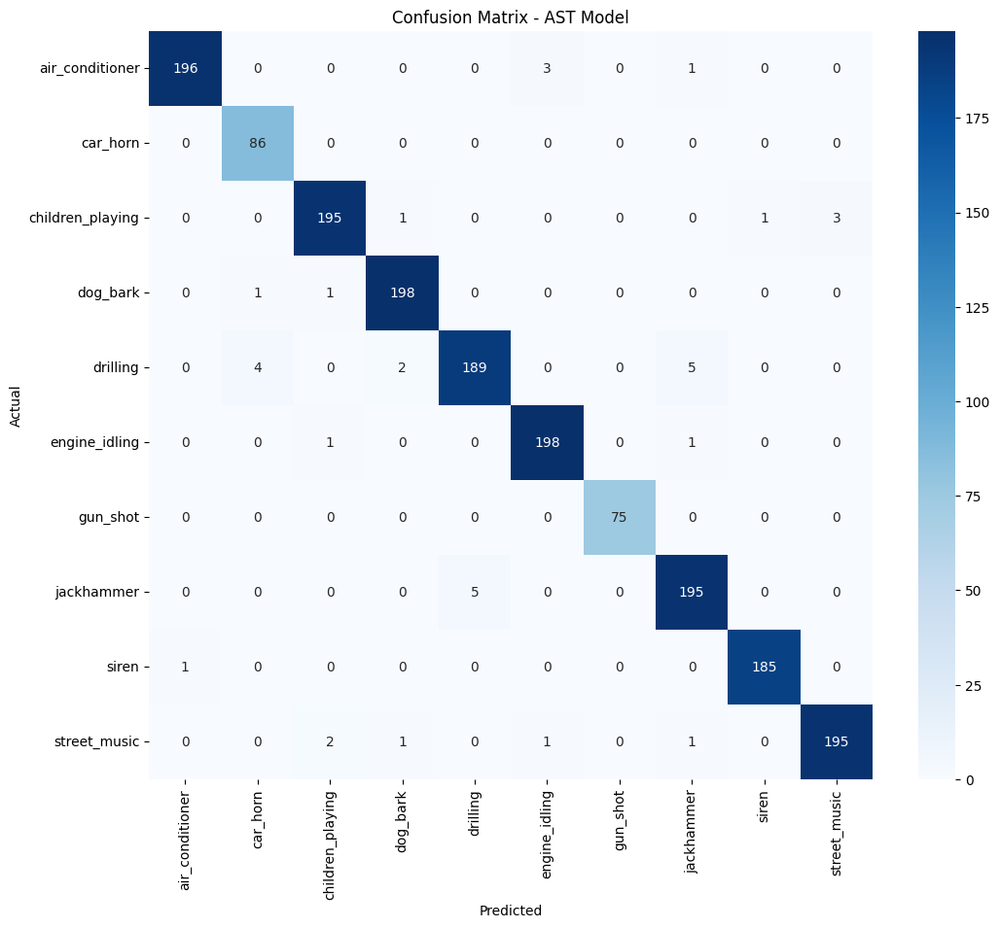

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Get predictions on the test set
predictions = trainer.predict(test_dataset)
y_preds = predictions.predictions.argmax(-1)
y_true = predictions.label_ids

# Create Confusion Matrix
cm = confusion_matrix(y_true, y_preds)

# Plot
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=label_encoder.classes_,
            yticklabels=label_encoder.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - AST Model')
plt.show()